# Notebook to make Fig. 6

In [1]:
# Import necessary packages & set-up plotting aesthetics

import numpy as np 
import pylab

import json
import random
import sys 
import os

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from matplotlib import style
from matplotlib.lines import Line2D

from fig_helper_functions import *

style.use('plotting.mplstyle')

### Load data

In [2]:
# Load in the predicted and observed draws 
f_root = '../Data/PopulationInferenceOutput/'
date = '071823'
with open(f_root+f'{date}_pred_vs_obs_spins_dict_pp.json', 'r') as f: 
    pred_vs_obs_spins = json.load(f)

In [3]:
posterior_runs = ['gaussian_sigma_0.1', 'gaussian_sigma_0.2', 'gaussian_sigma_0.3', 
                  'gaussian_sigma_0.4', 'gaussian_sigma_0.5', 'gaussian_sigma_1']

In [4]:
pred_vs_obs_spins['pop1']['gaussian_sigma_0.1'].keys()

dict_keys(['70events'])

### Make Figure

In [5]:
# Labels corresponding to each pop
labels_dict = {
    'pop1':r'$\mathrm{\textsc{HighSpinPrecessing}}$', 
    'pop2':r'$\mathrm{\textsc{MediumSpin}}$', 
    'pop3':r'$\mathrm{\textsc{LowSpinAligned}}$'
}

# Colors corresponding to different numbers of events
colors_dict = {
    pr:f'C{int(i)}' for i, pr in enumerate(posterior_runs)
}

# For legend
legend_handles = [Line2D([], [], color=c, label=r'$\sigma_\mathrm{meas} =$ '+l.split('_')[-1]) for l,c in colors_dict.items()]

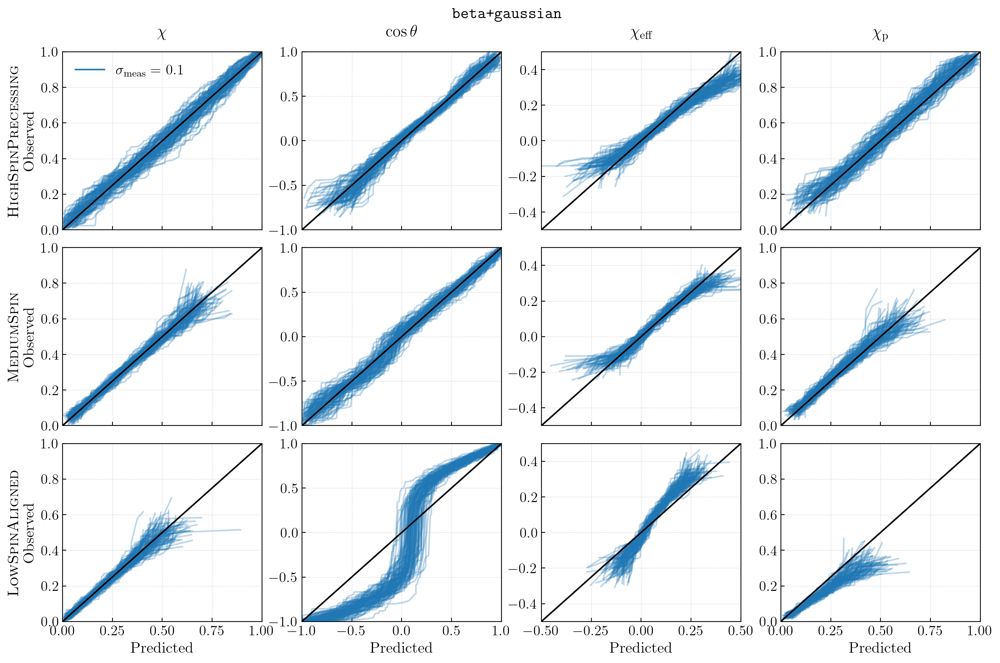

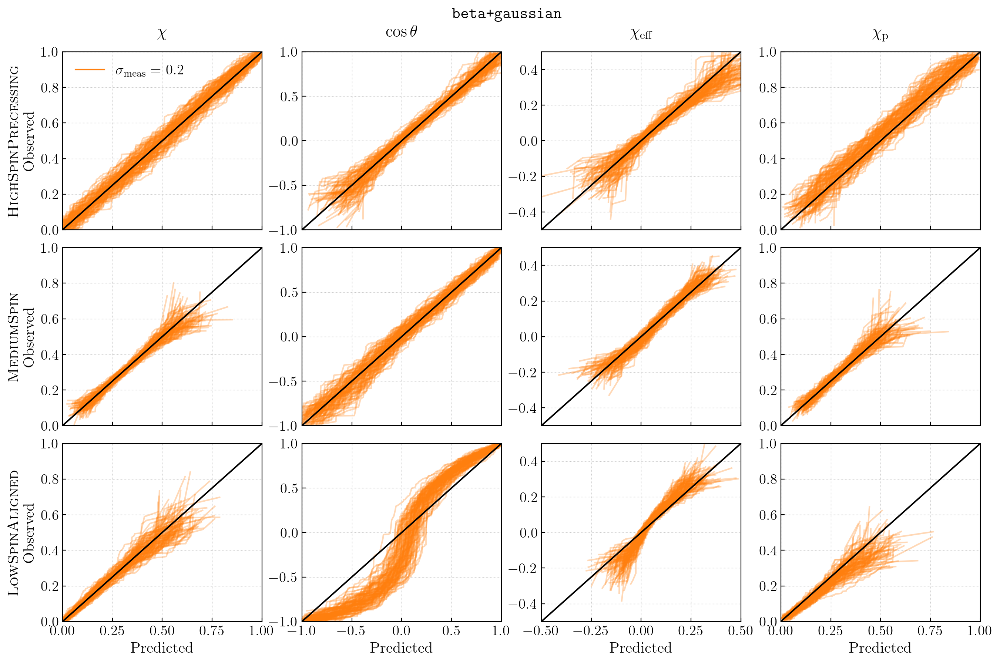

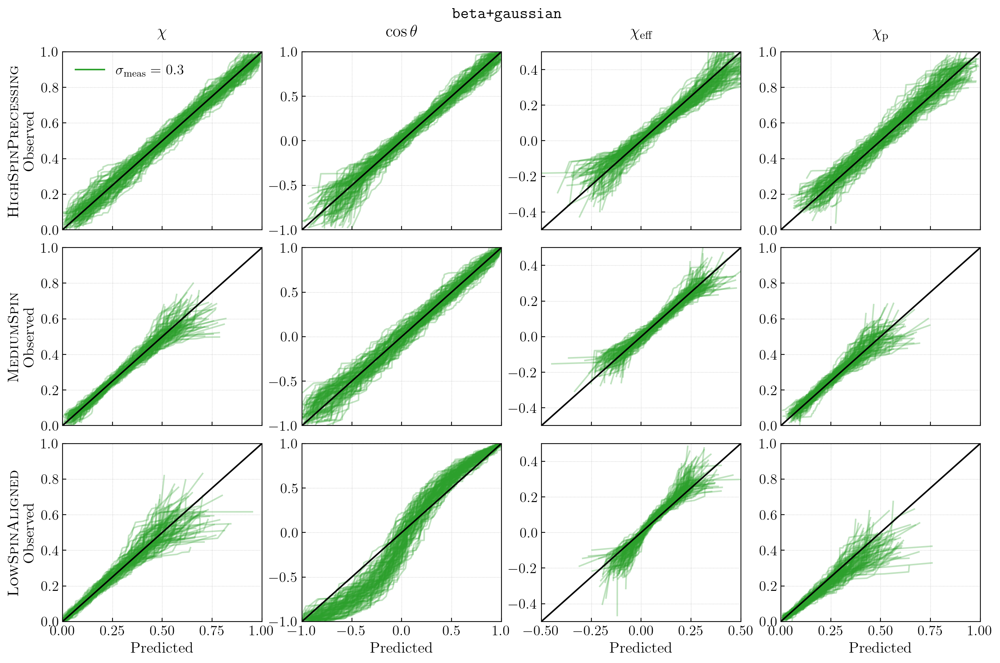

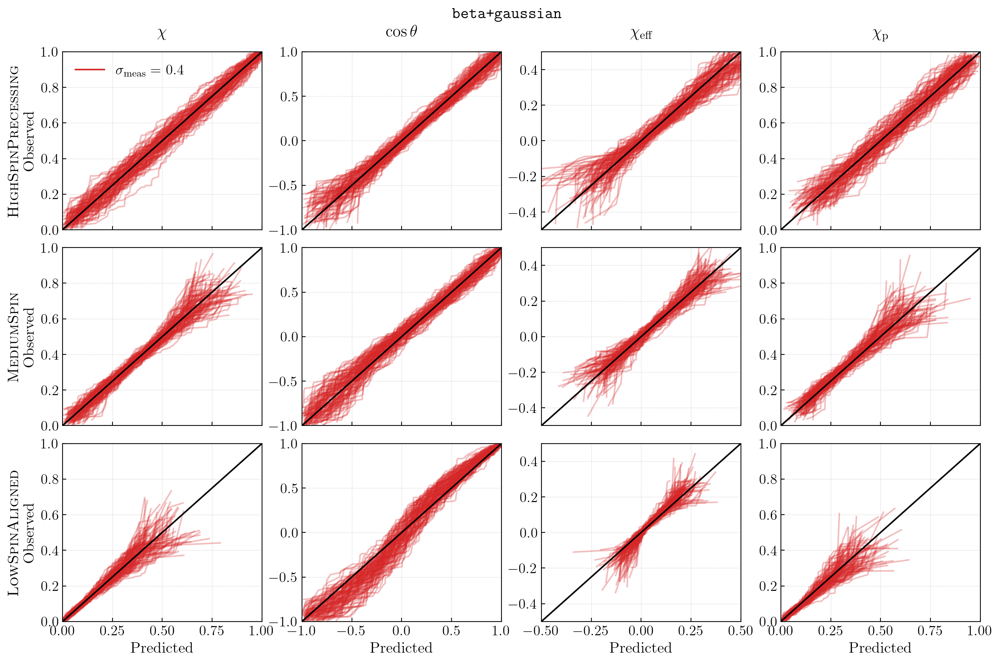

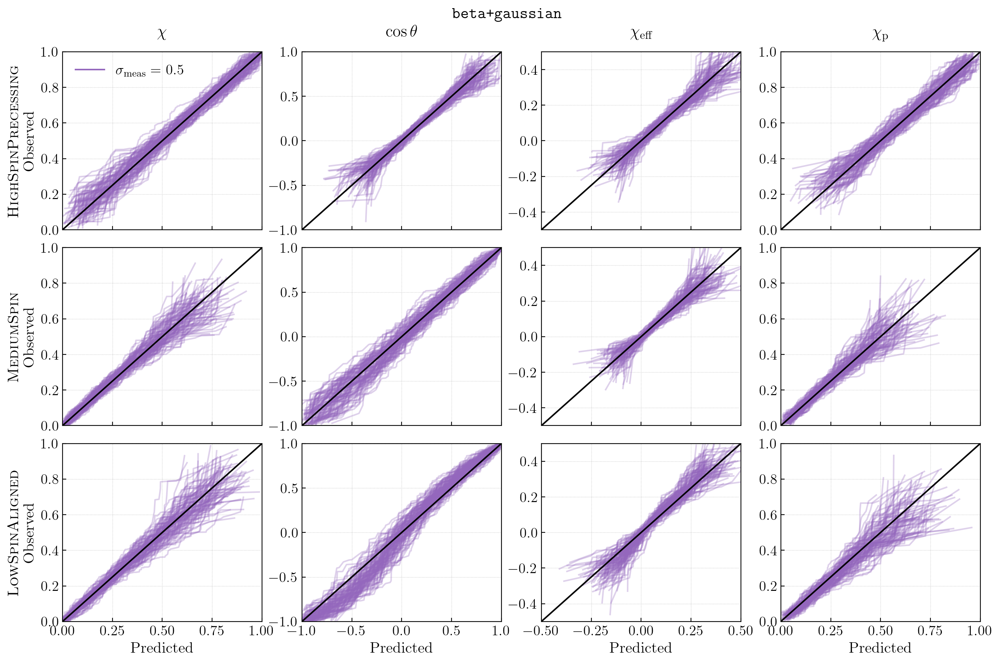

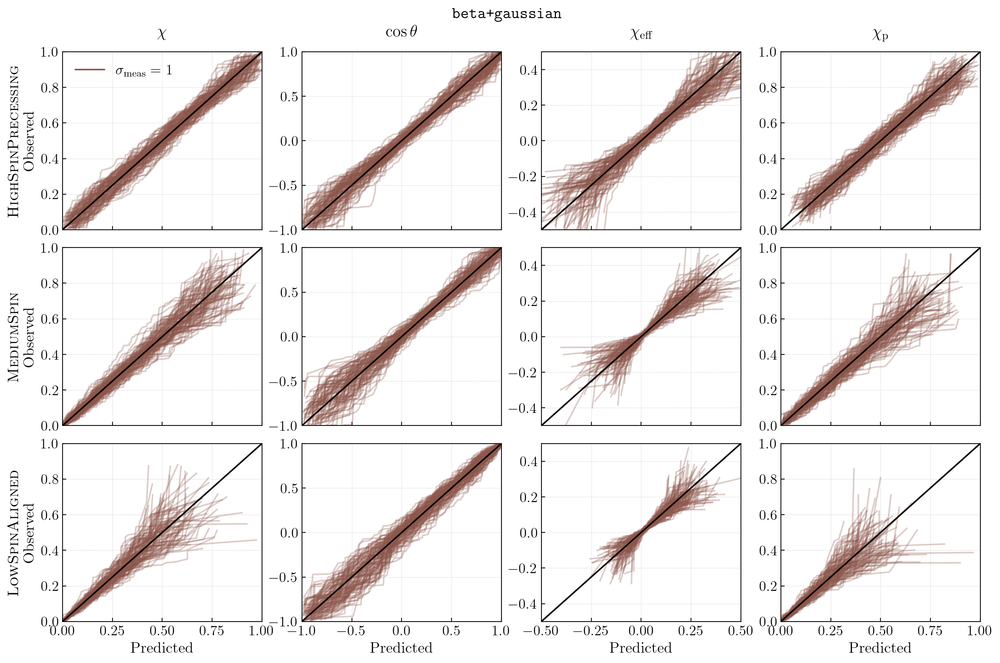

In [6]:
for k,nkey in enumerate(colors_dict.keys()):

    nCatalogs_to_plot = 100

    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16,10))

    for i,key in enumerate(labels_dict.keys()):

        # spin magnitudes
        for j in range(nCatalogs_to_plot):
            chi_pred = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['predicted']['chi1'][j], 
                                       pred_vs_obs_spins[key][nkey]['70events']['predicted']['chi2'][j]))
            chi_obs = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['observed']['chi1'][j], 
                                      pred_vs_obs_spins[key][nkey]['70events']['observed']['chi2'][j]))
            axes[i][0].plot(np.sort(chi_pred), np.sort(chi_obs), alpha=0.3, c=colors_dict[nkey])
        axes[i][0].plot([0, 1], [0, 1], color='k') # diagonal line
        axes[i][0].set_xlim(0,1)
        axes[i][0].set_ylim(0,1)

        # tilt angles
        for j in range(nCatalogs_to_plot):
            cost_pred = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['predicted']['cost1'][j], 
                                        pred_vs_obs_spins[key][nkey]['70events']['predicted']['cost2'][j]))
            cost_obs = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['observed']['cost1'][j], 
                                       pred_vs_obs_spins[key][nkey]['70events']['observed']['cost2'][j]))
            axes[i][1].plot(np.sort(cost_pred), np.sort(cost_obs), alpha=0.3, c=colors_dict[nkey])
        axes[i][1].plot([-1, 1], [-1, 1], color='k')
        axes[i][1].set_xlim(-1,1)
        axes[i][1].set_ylim(-1,1)

        # chieff
        for j in range(nCatalogs_to_plot):
            axes[i][2].plot(np.sort(pred_vs_obs_spins[key][nkey]['70events']['predicted']['chieff'][j]), 
                            np.sort(pred_vs_obs_spins[key][nkey]['70events']['observed']['chieff'][j]), alpha=0.3, 
                            c=colors_dict[nkey])
        axes[i][2].plot([-1, 1], [-1, 1], color='k')
        axes[i][2].set_xlim(-0.5, 0.5)
        axes[i][2].set_ylim(-0.5, 0.5)

        # chip
        for j in range(nCatalogs_to_plot):
            axes[i][3].plot(np.sort(pred_vs_obs_spins[key][nkey]['70events']['predicted']['chip'][j]), 
                            np.sort(pred_vs_obs_spins[key][nkey]['70events']['observed']['chip'][j]), alpha=0.3, 
                            c=colors_dict[nkey])
        axes[i][3].plot([0, 1], [0, 1], color='k')
        axes[i][3].set_xlim(0,1)
        axes[i][3].set_ylim(0,1)

        # set label
        axes[i][0].set_ylabel(f'{labels_dict[key]}\nObserved', fontsize=15)

        if i!=2: 
            for ax in axes[i]: 
                ax.set_xticklabels([])
        else: 
            for ax in axes[i]: 
                ax.set_xlabel('Predicted', fontsize=15)

    axes[0][0].set_title(r'$\chi$', fontsize=16, y=1.05)
    axes[0][1].set_title(r'$\cos\theta$', fontsize=16, y=1.05)
    axes[0][2].set_title(r'$\chi_\mathrm{eff}$', fontsize=16, y=1.05)
    axes[0][3].set_title(r'$\chi_\mathrm{p}$', fontsize=16, y=1.05)

    for ax in axes: 
        for a in ax:
            a.grid(ls=':', color='silver', lw=0.5)

    plt.subplots_adjust(hspace=0.1)

    # Add suptitle
    plt.suptitle(r'$\mathrm{\texttt{beta+gaussian}}$', fontsize=16, y=0.94)

    # Add legend
    axes[0][0].legend(handles=legend_handles[k:k+1], loc='upper left')

    plt.show()

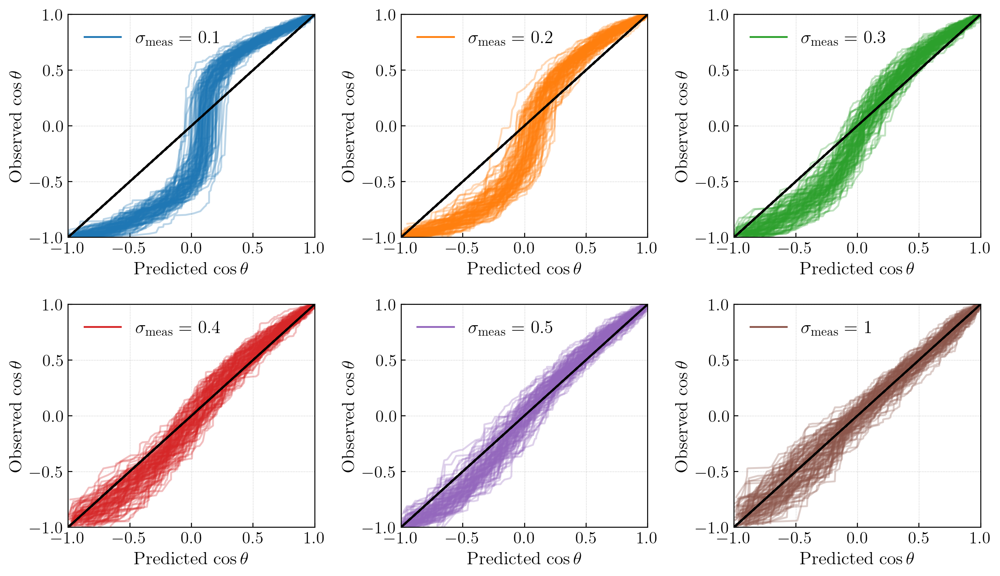

In [7]:
w = 4.5
plt.figure(figsize=(3*w,1.7*w))

for k,nkey in enumerate(colors_dict.keys()):
    
    subplot_num = int(230+k+1)
    
    plt.subplot(subplot_num)
    
    # tilt angles
    for j in range(100):
        cost_pred = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['predicted']['cost1'][j], 
                                    pred_vs_obs_spins[key][nkey]['70events']['predicted']['cost2'][j]))
        cost_obs = np.concatenate((pred_vs_obs_spins[key][nkey]['70events']['observed']['cost1'][j], 
                                   pred_vs_obs_spins[key][nkey]['70events']['observed']['cost2'][j]))
        plt.plot(np.sort(cost_pred), np.sort(cost_obs), alpha=0.3, c=colors_dict[nkey])
        
        bounds = [-1,1]
        plt.plot(bounds, bounds, color='k')
        plt.xlim(*bounds)
        plt.ylim(*bounds)
        
        plt.xlabel(r'Predicted $\cos\theta$', fontsize=15)
        plt.ylabel(r'Observed  $\cos\theta$', fontsize=15)
        
        plt.legend(handles=legend_handles[k:k+1], loc='upper left', fontsize=15)
        
        plt.grid(ls=':', color='silver', lw=0.5)

plt.subplots_adjust(wspace=0.35, hspace=0.3)
plt.savefig('figure_06_temp.pdf',bbox_inches='tight')
plt.show()